### **PART 1**

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!unzip  /content/gdrive/MyDrive/viz-data-plaksha-final-s2021.zip

Archive:  /content/gdrive/MyDrive/viz-data-plaksha-final-s2021.zip
   creating: viz-data-plaksha-final-s2021/
  inflating: __MACOSX/._viz-data-plaksha-final-s2021  
  inflating: viz-data-plaksha-final-s2021/ny.txt  
  inflating: __MACOSX/viz-data-plaksha-final-s2021/._ny.txt  
  inflating: viz-data-plaksha-final-s2021/yahoo.txt  
  inflating: __MACOSX/viz-data-plaksha-final-s2021/._yahoo.txt  
  inflating: viz-data-plaksha-final-s2021/google.txt  
  inflating: __MACOSX/viz-data-plaksha-final-s2021/._google.txt  


In [ ]:
# Verify that the zip file is extracted correctly.
!ls  viz-data-plaksha-final-s2021 | wc -l

3


In [ ]:
ny = pd.read_csv('/content/viz-data-plaksha-final-s2021/ny.txt', sep = '\t')
google = pd.read_csv('/content/viz-data-plaksha-final-s2021/google.txt', sep = '\t')
yahoo = pd.read_csv('/content/viz-data-plaksha-final-s2021/yahoo.txt', sep = '\t')

In [ ]:
# display the head of the datasets
print(ny.head())
print('\n')
print(google.head())
print('\n')
print(yahoo.head())

   Modified Julian Date  Max Temperature
0                 48988               52
1                 49019               38
2                 49047               31
3                 49078               66
4                 49108               75


   Modified Julian Date  Stock Value
0                 55463       527.21
1                 55462       513.48
2                 55461       516.00
3                 55460       513.46
4                 55459       508.28


   Modified Julian Date  Stock Value
0                 55463        14.40
1                 55462        14.17
2                 55461        14.04
3                 55460        14.18
4                 55459        13.86


In [ ]:
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from cycler import cycler

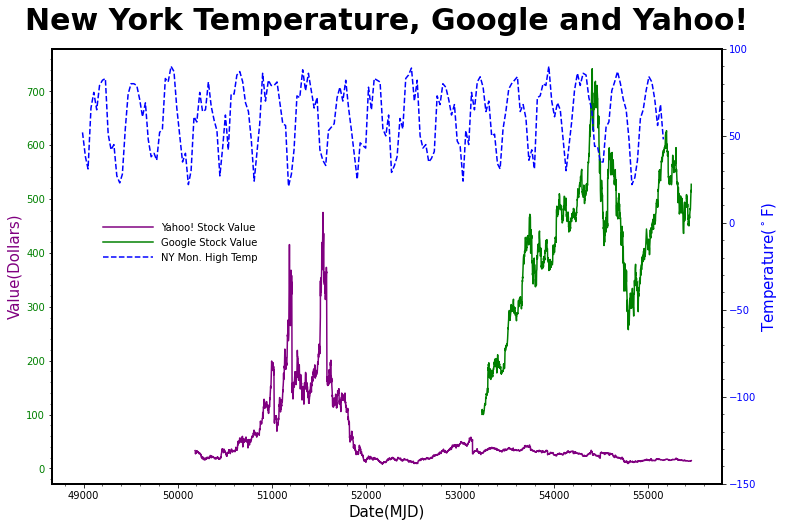

In [ ]:
fig, ax0 = plt.subplots(1, 1, figsize = (12,8))
ax0.set_title('New York Temperature, Google and Yahoo!', fontsize = 30, fontname = 'Times New Roman',fontweight = 'bold')
ax0.title.set_y(1.03)
plt1 = ax0.plot(yahoo['Modified Julian Date'], yahoo['Stock Value'], color = 'purple', label = 'Yahoo! Stock Value')
plt2 = ax0.plot(google['Modified Julian Date'], google['Stock Value'], color = 'green', label = 'Google Stock Value')
ax0.set_xlabel('Date(MJD)', fontsize = 15, fontname = 'Arial')
ax0.set_ylabel('Value(Dollars)', fontsize = 15, fontname = 'Arial',color='purple')
ax0.spines['top'].set_linewidth(2)
ax0.spines['bottom'].set_linewidth(2)
ax0.spines['left'].set_linewidth(2)
ax0.spines['right'].set_linewidth(2)

ax0.minorticks_on()
ax0.tick_params(axis = 'y', labelcolor = 'green')


ax0.set_ylabel('Value(Dollars)', fontsize = 15, fontname = 'Arial',color='purple')
ax1 = ax0.twinx()
plt3 = ax1.plot(ny['Modified Julian Date'], ny['Max Temperature'], ls = 'dashed', color = 'blue', label = 'NY Mon. High Temp')
ax1.set_ylim(-150,100)
ax1.set_ylabel('Temperature($^\circ$F)', fontsize = 15, fontname = 'Arial',color='blue')
ax1.minorticks_on()
ax1.tick_params(axis = 'y', labelcolor = 'blue')
plot = plt1+plt2+plt3
labels = [label.get_label() for label in plot]
ax1.legend(plot, labels, loc=(0.07, 0.5), frameon = False, handlelength = 5)


### **PART 2**

# Transfer Learning using EfficientNetB0
- In this notebook, I have used **Transfer Learning** to classify images of **Cat, Kanye West and Pickachu** using pre-trained ImageNet model **EfficientNetB0**.
- The image data used in this notebook has been scrapped from the internet.

In [2]:
pip install bing-image-downloader

In [3]:
from bing_image_downloader import downloader


In [31]:
query_string="Kanye west angry"

In [32]:
downloader.download(query_string, limit=1000,  output_dir='/content/drive/MyDrive/dataset', adult_filter_off=True, force_replace=False, timeout=60, verbose=True)

Streaming output truncated to the last 5000 lines.
[%] Indexed 15 Images on Page 6468.




[!!]Indexing page: 6469

[%] Indexed 15 Images on Page 6469.




[!!]Indexing page: 6470

[%] Indexed 15 Images on Page 6470.




[!!]Indexing page: 6471

[%] Indexed 15 Images on Page 6471.




[!!]Indexing page: 6472

[%] Indexed 22 Images on Page 6472.




[!!]Indexing page: 6473

[%] Indexed 15 Images on Page 6473.




[!!]Indexing page: 6474

[%] Indexed 15 Images on Page 6474.




[!!]Indexing page: 6475

[%] Indexed 15 Images on Page 6475.




[!!]Indexing page: 6476

[%] Indexed 15 Images on Page 6476.




[!!]Indexing page: 6477

[%] Indexed 15 Images on Page 6477.




[!!]Indexing page: 6478

[%] Indexed 15 Images on Page 6478.




[!!]Indexing page: 6479

[%] Indexed 15 Images on Page 6479.




[!!]Indexing page: 6480

[%] Indexed 15 Images on Page 6480.




[!!]Indexing page: 6481

[%] Indexed 15 Images on Page 6481.




[!!]Indexing page: 6482

[%] Indexed 15 Images on Page 6482.





ConnectionResetError: ignored

In [4]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras.preprocessing.image import (load_img, img_to_array, 
                                                  ImageDataGenerator)

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [14]:
MAIN_DIR ='/content/drive/MyDrive/dataset'
PIKACHU_DIR = MAIN_DIR + '/Pikachu'


In [15]:
PIKACHU_DIR1 = MAIN_DIR + '/Pikachu smiling'

In [16]:
PIKACHU_DIR2 = MAIN_DIR + '/Cute Pikachu'

In [24]:
PIKACHU_DIR3 = MAIN_DIR + '/Pikachu lightning'

In [29]:
PIKACHU_DIR4 = MAIN_DIR + '/Pikachu image'

In [18]:
# define some global variables
BATCH_SIZE = 32
SEED = 42
IMG_SIZE = (224, 224)
LABELS = ['cat', 'kanye', 'pikachu']

### ***Read pikkachu images ***

In [19]:
images_data = []   # to store images
image_labels = []   # to store labels

# read and prepare images and labels 
for file_name in tqdm(os.listdir(PIKACHU_DIR)):
  try:
    # load and resize images
    image = load_img(os.path.join(PIKACHU_DIR, file_name), 
                     target_size = IMG_SIZE)
    # convert image into array
    images_data.append(img_to_array(image))
    # prepare labels 
    image_labels.append(2)
  except:
    print(f'{file_name} image file is empty')

  7%|▋         | 21/314 [00:00<00:09, 29.88it/s]/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
100%|██████████| 314/314 [00:08<00:00, 35.95it/s]


In [20]:
# read and prepare images and labels 
for file_name in tqdm(os.listdir(PIKACHU_DIR1)):
  try:
    # load and resize images
    image = load_img(os.path.join(PIKACHU_DIR1, file_name), 
                     target_size = IMG_SIZE)
    # convert image into array
    images_data.append(img_to_array(image))
    # prepare labels 
    image_labels.append(2)
  except:
    print(f'{file_name} image file is empty')

100%|██████████| 11/11 [00:00<00:00, 23.69it/s]

.ipynb_checkpoints image file is empty


In [21]:
# read and prepare images and labels 
for file_name in tqdm(os.listdir(PIKACHU_DIR2)):
  try:
    # load and resize images
    image = load_img(os.path.join(PIKACHU_DIR2, file_name), 
                     target_size = IMG_SIZE)
    # convert image into array
    images_data.append(img_to_array(image))
    # prepare labels 
    image_labels.append(2)
  except:
    print(f'{file_name} image file is empty')

 26%|██▌       | 99/383 [00:02<00:05, 55.85it/s]/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
 96%|█████████▋| 369/383 [00:06<00:00, 58.49it/s]

.ipynb_checkpoints image file is empty


100%|██████████| 383/383 [00:06<00:00, 58.14it/s]


In [25]:
# read and prepare images and labels 
for file_name in tqdm(os.listdir(PIKACHU_DIR3)):
  try:
    # load and resize images
    image = load_img(os.path.join(PIKACHU_DIR3, file_name), 
                     target_size = IMG_SIZE)
    # convert image into array
    images_data.append(img_to_array(image))
    # prepare labels 
    image_labels.append(2)
  except:
    print(f'{file_name} image file is empty')

100%|██████████| 20/20 [00:00<00:00, 75.59it/s]

.ipynb_checkpoints image file is empty


In [30]:
# read and prepare images and labels 
for file_name in tqdm(os.listdir(PIKACHU_DIR4)):
  try:
    # load and resize images
    image = load_img(os.path.join(PIKACHU_DIR4, file_name), 
                     target_size = IMG_SIZE)
    # convert image into array
    images_data.append(img_to_array(image))
    # prepare labels 
    image_labels.append(2)
  except:
    print(f'{file_name} image file is empty')

 23%|██▎       | 109/466 [00:04<00:09, 36.30it/s]/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
100%|██████████| 466/466 [00:12<00:00, 36.66it/s]


### **KANYE WEST IMAGES**

In [33]:
MAIN_DIR1 ='/content/drive/MyDrive/dataset'
KW_DIR = MAIN_DIR1 + '/Kanye'
KW_DIR1 = MAIN_DIR1 + '/Kanye West'
KW_DIR2 = MAIN_DIR1 + '/Kanye West alone'
KW_DIR3 = MAIN_DIR1 + '/Kanye West image'
KW_DIR4 = MAIN_DIR1 + '/Kanye West picture'
KW_DIR5 = MAIN_DIR1 + '/Kanye West stare'
KW_DIR6=  MAIN_DIR1+'/Kanye West Smiling'
KW_DIR7= MAIN_DIR1+'/Kanye west angry'






In [34]:


# read and prepare images and labels 
for file_name in tqdm(os.listdir(KW_DIR)):
  try:
    # load and resize images
    image = load_img(os.path.join(KW_DIR, file_name), 
                     target_size = IMG_SIZE)
    # convert image into array
    images_data.append(img_to_array(image))
    # prepare labels 
    image_labels.append(1)
  except:
    print(f'{file_name} image file is empty')

100%|██████████| 76/76 [00:22<00:00,  3.44it/s]

.ipynb_checkpoints image file is empty


In [35]:
# read and prepare images and labels 
for file_name in tqdm(os.listdir(KW_DIR1)):
  try:
    # load and resize images
    image = load_img(os.path.join(KW_DIR1, file_name), 
                     target_size = IMG_SIZE)
    # convert image into array
    images_data.append(img_to_array(image))
    # prepare labels 
    image_labels.append(1)
  except:
    print(f'{file_name} image file is empty')

100%|██████████| 150/150 [00:30<00:00,  4.84it/s]


In [36]:
# read and prepare images and labels 
for file_name in tqdm(os.listdir(KW_DIR2)):
  try:
    # load and resize images
    image = load_img(os.path.join(KW_DIR2, file_name), 
                     target_size = IMG_SIZE)
    # convert image into array
    images_data.append(img_to_array(image))
    # prepare labels 
    image_labels.append(1)
  except:
    print(f'{file_name} image file is empty')

100%|██████████| 93/93 [00:39<00:00,  2.34it/s]

.ipynb_checkpoints image file is empty


In [37]:
# read and prepare images and labels 
for file_name in tqdm(os.listdir(KW_DIR3)):
  try:
    # load and resize images
    image = load_img(os.path.join(KW_DIR3, file_name), 
                     target_size = IMG_SIZE)
    # convert image into array
    images_data.append(img_to_array(image))
    # prepare labels 
    image_labels.append(1)
  except:
    print(f'{file_name} image file is empty')

100%|██████████| 100/100 [00:40<00:00,  2.48it/s]

.ipynb_checkpoints image file is empty


In [38]:
# read and prepare images and labels 
for file_name in tqdm(os.listdir(KW_DIR4)):
  try:
    # load and resize images
    image = load_img(os.path.join(KW_DIR4, file_name), 
                     target_size = IMG_SIZE)
    # convert image into array
    images_data.append(img_to_array(image))
    # prepare labels 
    image_labels.append(1)
  except:
    print(f'{file_name} image file is empty')

 22%|██▏       | 20/92 [00:08<00:27,  2.60it/s]

.ipynb_checkpoints image file is empty


100%|██████████| 92/92 [00:37<00:00,  2.48it/s]


In [39]:
# read and prepare images and labels 
for file_name in tqdm(os.listdir(KW_DIR5)):
  try:
    # load and resize images
    image = load_img(os.path.join(KW_DIR5, file_name), 
                     target_size = IMG_SIZE)
    # convert image into array
    images_data.append(img_to_array(image))
    # prepare labels 
    image_labels.append(1)
  except:
    print(f'{file_name} image file is empty')

 29%|██▉       | 68/235 [00:05<00:04, 36.86it/s]

.ipynb_checkpoints image file is empty


100%|██████████| 235/235 [00:09<00:00, 25.25it/s]


In [40]:
# read and prepare images and labels 
for file_name in tqdm(os.listdir(KW_DIR6)):
  try:
    # load and resize images
    image = load_img(os.path.join(KW_DIR6, file_name), 
                     target_size = IMG_SIZE)
    # convert image into array
    images_data.append(img_to_array(image))
    # prepare labels 
    image_labels.append(1)
  except:
    print(f'{file_name} image file is empty')

100%|██████████| 100/100 [00:02<00:00, 46.59it/s]

.ipynb_checkpoints image file is empty


In [41]:
# read and prepare images and labels 
for file_name in tqdm(os.listdir(KW_DIR7)):
  try:
    # load and resize images
    image = load_img(os.path.join(KW_DIR7, file_name), 
                     target_size = IMG_SIZE)
    # convert image into array
    images_data.append(img_to_array(image))
    # prepare labels 
    image_labels.append(1)
  except:
    print(f'{file_name} image file is empty')

100%|██████████| 276/276 [00:04<00:00, 55.73it/s]


## **Reading cat dataset**

In [42]:
path='/content/drive/MyDrive/cats'

In [43]:
count=0
from sys import path_hooks
# read and prepare images and labels 
for file_name in tqdm(os.listdir(path)):
  try:
    # load and resize images
    image = load_img(os.path.join(path, file_name), 
                     target_size = IMG_SIZE)
    # convert image into array
    images_data.append(img_to_array(image))
    # prepare labels 
    image_labels.append(0)
    count=count+1
    if count>1200:
      break
  except:
    print(f'{file_name} image file is empty')

 73%|███████▎  | 1200/1651 [00:22<00:08, 52.49it/s] 


## Display few random images from the dataset

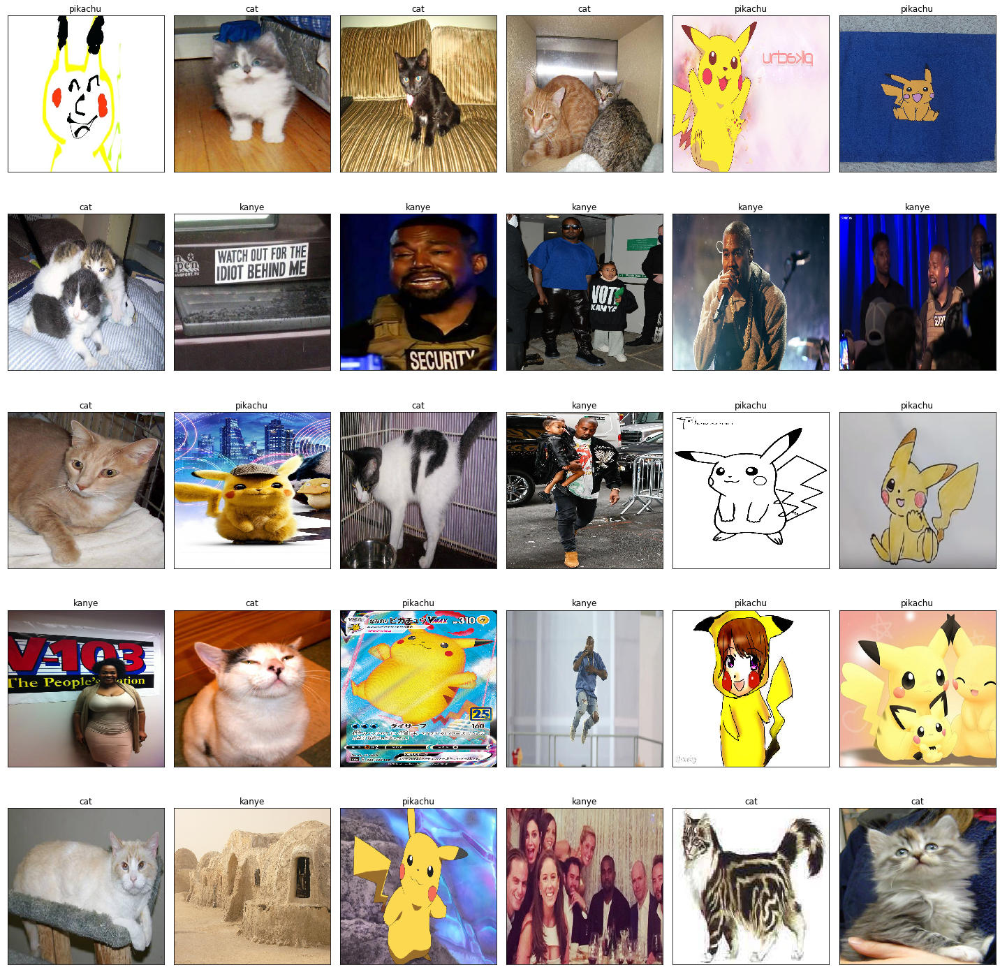

In [44]:
# create figure object
fig, axes = plt.subplots(5, 6, figsize = (20, 20))
for i, ax in enumerate(axes.flatten()):
  # choose random index
  index = np.random.choice(len(images_data))
    
  # display image and label
  ax.imshow(images_data[index] / 255.0)
  ax.set_title(LABELS[image_labels[index]])

  # make figure axes invisible
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
plt.tight_layout()

### **Splitting data into training,Test and validation set**

In [45]:
from sklearn.model_selection import train_test_split

In [46]:
#test split
X, X_test, y, y_test = train_test_split( np.array(images_data), np.array(image_labels), test_size=0.013, random_state=42,stratify = np.array(image_labels))
#train and validation split
X_train,X_val,y_train,y_val=train_test_split(X, y, test_size=0.15, random_state=42,stratify = y)
# print the shape of train, test and validation data sets
print(f'Shape of x_train: {X_train.shape}\nShape of y_train: {y_train.shape}')
print(f'Shape of x_test: {X_test.shape}\nShape of y_test: {y_test.shape}')
print(f'Shape of x_val: {X_val.shape}\nShape of y_val: {y_val.shape}')

Shape of x_train: (2942, 224, 224, 3)
Shape of y_train: (2942,)
Shape of x_test: (46, 224, 224, 3)
Shape of y_test: (46,)
Shape of x_val: (520, 224, 224, 3)
Shape of y_val: (520,)


## Load pretrained model

In [47]:
# EfficientNetB0 model
base_model = tf.keras.applications.EfficientNetB0(include_top = False,
                                                  weights = 'imagenet',
                                                  input_shape = (224, 224, 3))

# freeze the base model
base_model.trainable = False

x = tf.keras.layers.GlobalAveragePooling2D(name = 'g_pool')(base_model.output)
x = tf.keras.layers.Dropout(0.3, name = 'drop_1')(x)
x = tf.keras.layers.Dense(32, activation = 'relu', name = 'dense_1')(x)
x = tf.keras.layers.Dropout(0.3, name = 'drop_2')(x)
output = tf.keras.layers.Dense(3, activation = 'softmax', name = 'output')(x)

model = tf.keras.Model(base_model.inputs, output, name = 'classification_model')
model.summary()

16719872/16705208 [==============================] - 0s 0us/step
Model: "classification_model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 stem_conv_pad

## Compile and fit the model

In [48]:
model.compile(loss = 'sparse_categorical_crossentropy',
              optimizer = 'adam',
              metrics = ['accuracy'])


history = model.fit(X_train, y_train,
                    batch_size = 32,
                    epochs = 20,
                    validation_data = (X_val, y_val))

Epoch 1/20
92/92 [==============================] - 171s 2s/step - loss: 0.2366 - accuracy: 0.9191 - val_loss: 0.0757 - val_accuracy: 0.9769
Epoch 2/20
92/92 [==============================] - 158s 2s/step - loss: 0.0958 - accuracy: 0.9687 - val_loss: 0.0621 - val_accuracy: 0.9808
Epoch 3/20
92/92 [==============================] - 161s 2s/step - loss: 0.0722 - accuracy: 0.9799 - val_loss: 0.0614 - val_accuracy: 0.9769
Epoch 4/20
92/92 [==============================] - 159s 2s/step - loss: 0.0529 - accuracy: 0.9816 - val_loss: 0.0557 - val_accuracy: 0.9846
Epoch 5/20
92/92 [==============================] - 159s 2s/step - loss: 0.0483 - accuracy: 0.9844 - val_loss: 0.0439 - val_accuracy: 0.9846
Epoch 6/20
92/92 [==============================] - 166s 2s/step - loss: 0.0418 - accuracy: 0.9867 - val_loss: 0.0425 - val_accuracy: 0.9865
Epoch 7/20
92/92 [==============================] - 153s 2s/step - loss: 0.0363 - accuracy: 0.9895 - val_loss: 0.0505 - val_accuracy: 0.9788
Epoch 8/20
92

## Plot training and validation loss 

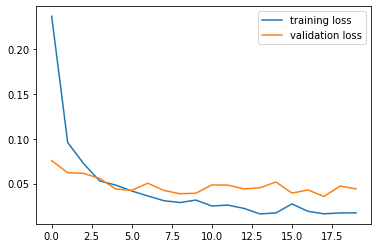

In [56]:
# training and validation loss
plt.plot(range(0, 20), history.history['loss'])
plt.plot(range(0, 20), history.history['val_loss'])
plt.legend(['training loss', 'validation loss'])

##Plot training and validation accuracy

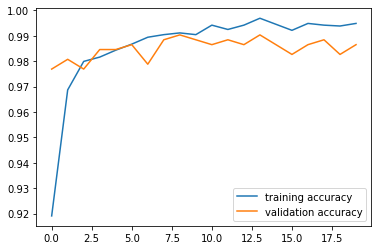

In [57]:
# training and validation accuracy
plt.plot(range(0, 20), history.history['accuracy'])
plt.plot(range(0, 20), history.history['val_accuracy'])
plt.legend(['training accuracy', 'validation accuracy'])


## Evaluate the model performance on the test data

In [58]:
# calculate class probabilities
class_probs = model.predict(X_test)

# extract index with maximum probabilities
labels = np.argmax(class_probs, axis = -1)

# print class probabilities
print(class_probs)

[[9.99998331e-01 4.17362642e-08 1.68617055e-06]
 [9.99991655e-01 5.26599308e-07 7.90122431e-06]
 [1.14443415e-08 1.00000000e+00 7.42523491e-12]
 [1.00000000e+00 3.06614067e-09 8.41381009e-09]
 [1.04454028e-08 9.99999881e-01 1.71195182e-07]
 [2.56845514e-08 1.02392198e-06 9.99998927e-01]
 [4.04896309e-06 4.55205562e-03 9.95443940e-01]
 [3.99210075e-11 3.29009922e-08 1.00000000e+00]
 [3.44031847e-09 9.99999642e-01 3.64069024e-07]
 [1.77014137e-09 1.00000000e+00 5.15869125e-10]
 [1.00000000e+00 4.65746108e-09 3.11894932e-09]
 [4.74423450e-06 9.99928236e-01 6.69352303e-05]
 [4.74418312e-06 9.99994636e-01 5.61500030e-07]
 [9.99998450e-01 1.41891826e-06 1.67323321e-07]
 [7.92296506e-10 2.25486758e-07 9.99999762e-01]
 [2.71277911e-09 3.38790827e-08 1.00000000e+00]
 [9.99996901e-01 3.02940316e-06 6.23102423e-08]
 [2.81797043e-07 1.69943273e-03 9.98300254e-01]
 [1.80524324e-08 2.73867845e-05 9.99972582e-01]
 [1.00000000e+00 1.62062065e-11 2.08097584e-09]
 [2.08638639e-07 9.99999762e-01 2.420609

## Display test results

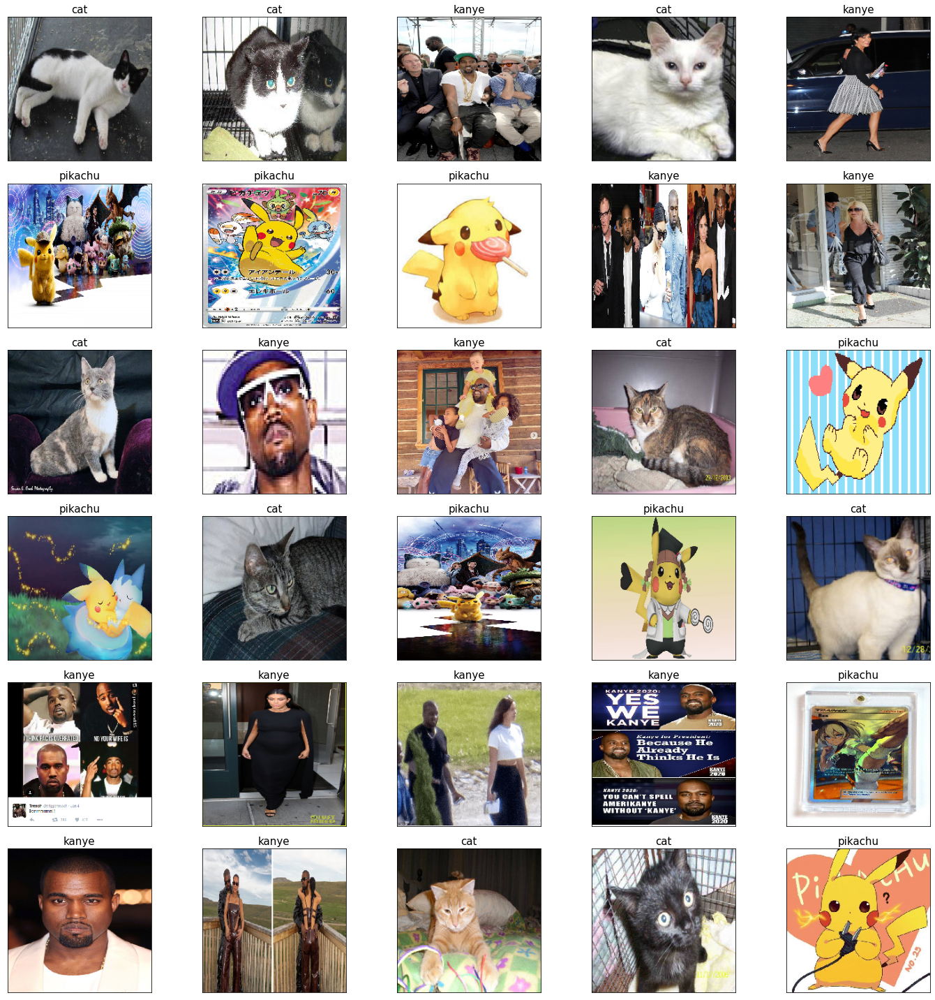

In [60]:
# first 30 examples
fig, axis = plt.subplots(6, 5, figsize = (20, 20))
for i, ax in enumerate(axis.flatten()):
  # show image and predicted label
  ax.imshow(X_test[i] / 255)
  ax.set_title(LABELS[labels[i]], fontsize = 15)
  # make figure axes invisible
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
plt.tight_layout()

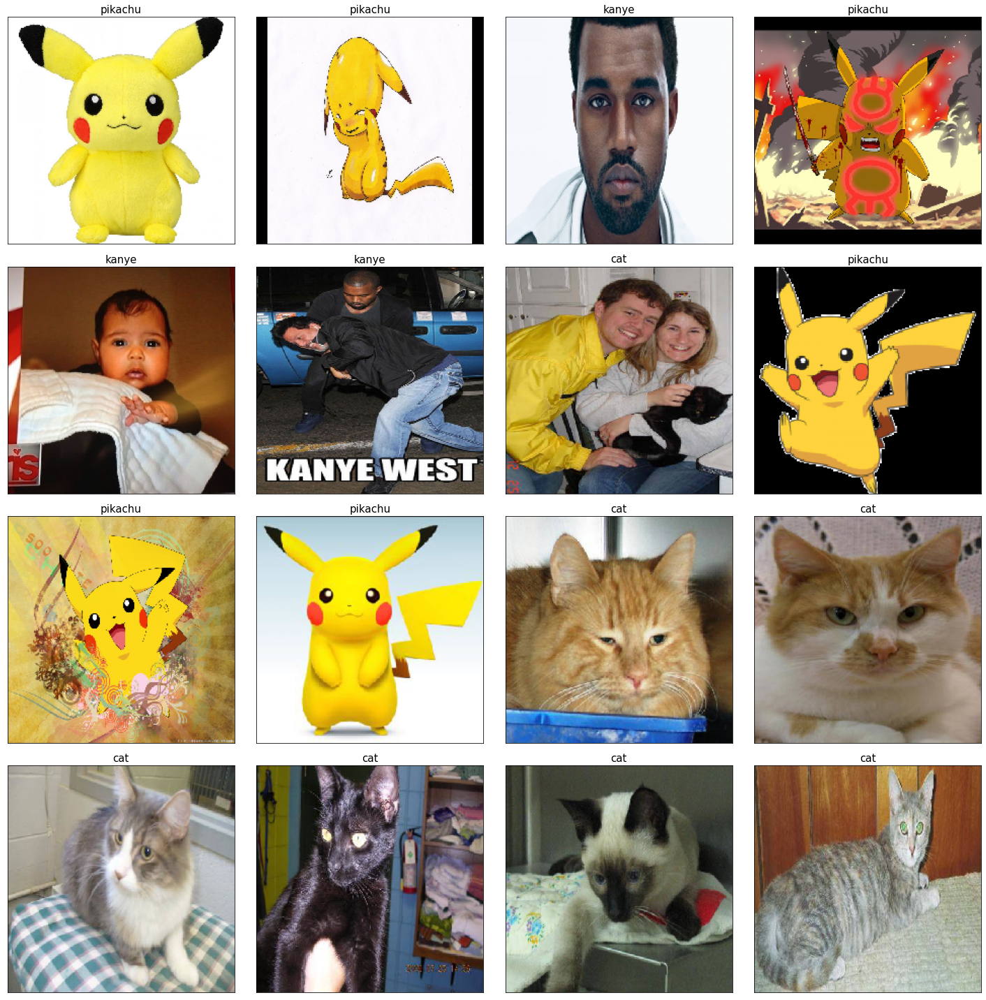

In [61]:
# first 16 examples
fig, axis = plt.subplots(4, 4, figsize = (20, 20))
for i, ax in enumerate(axis.flatten()):
  # show image and predicted label
  ax.imshow(X_test[i+30] / 255)
  ax.set_title(LABELS[labels[i+30]], fontsize = 15)
  # make figure axes invisible
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
plt.tight_layout()

### Plot confusion matrix 

In [64]:
# evaluate model on validation data
print("pred=",model.predict(X_val))
y_pred = np.argmax(model.predict(X_val), axis = -1)
print(y_pred)

pred= [[1.0000000e+00 8.6266887e-09 7.3750828e-09]
 [9.6260866e-10 5.0329461e-05 9.9994969e-01]
 [3.1123072e-08 1.0000000e+00 7.8726128e-09]
 ...
 [4.2514181e-08 9.9999869e-01 1.3282580e-06]
 [8.0990849e-06 9.9999154e-01 3.7679527e-07]
 [9.9998462e-01 3.4088853e-07 1.5005011e-05]]
[0 2 1 2 0 2 0 0 2 1 1 1 0 2 2 0 0 0 0 0 1 1 2 0 0 1 0 2 0 1 1 0 2 2 2 0 0
 0 2 0 2 1 1 2 1 2 2 1 1 0 1 1 1 0 1 0 1 0 0 0 1 2 2 2 0 2 1 2 2 1 2 1 0 0
 0 2 0 1 0 2 1 1 0 2 0 2 1 0 1 2 0 1 0 0 2 1 0 0 1 1 0 1 2 1 1 2 2 1 2 2 0
 0 1 0 0 2 1 2 0 1 2 2 2 2 2 2 0 0 0 1 2 2 2 1 0 0 0 0 0 0 0 0 0 1 0 1 2 0
 1 1 2 1 0 0 0 2 2 0 2 2 1 0 2 1 1 1 2 2 1 2 1 0 2 2 2 2 1 2 1 0 1 0 1 2 0
 2 0 2 1 2 0 1 0 1 0 0 0 1 0 0 2 0 0 0 2 1 1 2 2 2 1 2 1 2 2 0 1 1 2 0 1 0
 0 2 0 1 0 2 1 1 1 0 0 1 0 2 2 2 2 2 0 2 2 1 0 1 1 0 0 1 1 2 1 2 0 0 0 2 2
 0 2 0 1 0 1 2 0 2 0 0 1 0 2 2 1 2 2 2 2 1 0 0 0 2 1 2 0 1 1 2 0 1 1 0 1 0
 1 0 0 2 2 0 0 0 0 2 0 1 1 0 0 1 0 1 2 2 2 0 2 2 0 0 0 0 2 1 1 2 1 2 1 0 2
 0 2 2 0 1 1 2 2 2 0 0 0 2 0 0 1 2 2 0 0 1 

In [65]:
confusion_matrix(y_val, y_pred, labels = [0, 1, 2])


array([[178,   0,   0],
       [  1, 162,   2],
       [  3,   1, 173]])